In [1]:
%matplotlib inline
import project_path
from src.util.graph import *
from src.util.generate_anomaly import generate_sparse_anomaly, generate_local_anomaly, generate_temporal_anomaly, generate_spatio_temporal_anomaly
from src.util.gsp_vis import draw_graph_signal, GraphSignalAnimation
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import matplotlib as mpl
from matplotlib import cm

In [2]:
%matplotlib inline
from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl

In [4]:
# rand_graph_param = {'dim': 20, 'type': 'er', 'g_params': 0.18, 'seed': 31}
G = nx.grid_2d_graph(6,6)
# G = nx.random_geometric_graph(36,0.22, seed=100)
GP = GraphProcess(G=G, seed=100, filter_type='Heat', filter_parameters=10)
x = GP.gen_signal(1,0,0)
X = x['X']
# anomaly, anomaly_labels = generate_sparse_anomaly(X,'constant', np.mean(np.abs(X)*2), ratio=0.2)
anomaly, anomaly_labels = generate_sparse_anomaly(X,'constant', 1, num_of_anomalies=1)
# Y = X+anomaly
Y = anomaly
A = nx.adjacency_matrix(G)
Ay = A@Y
AAy = A@Ay
# print(A@anomaly_labels)

C:\Users\merti\AppData\Local\Temp\ipykernel_29048\1752717475.py:11: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


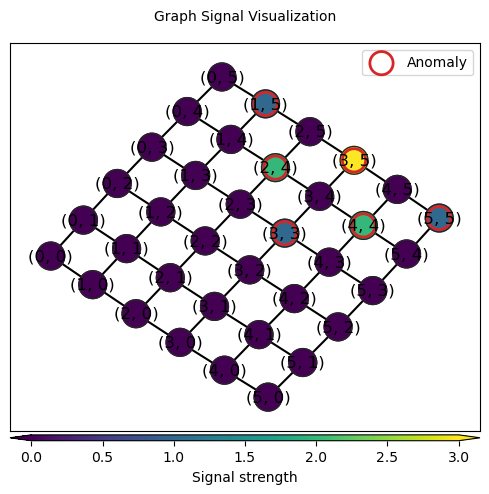

In [7]:
# fig, axe = draw_graph_signal(G,Y[:,7], anomaly_labels=anomaly_labels[:,7], figsize=(5,5))
# fig, axe = draw_graph_signal(G,Y, anomaly_labels=anomaly_labels, figsize=(5,5))
# fig, axe = draw_graph_signal(G,Ay, anomaly_labels=A@anomaly_labels==1, figsize=(5,5))
fig, axe = draw_graph_signal(G,AAy, anomaly_labels=A@A@anomaly_labels!=0, figsize=(5,5))

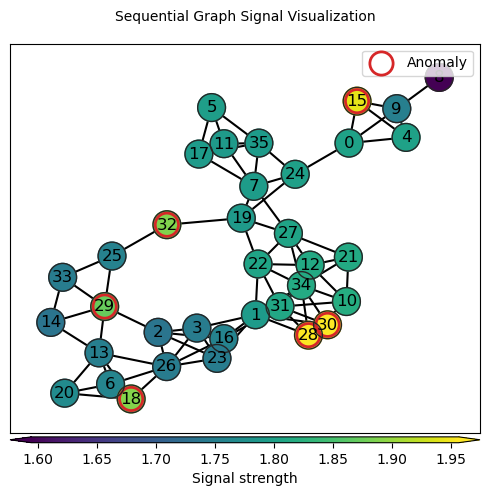

In [4]:
GSPAnimation = GraphSignalAnimation(G,Y, anomaly_labels=anomaly_labels, figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=20, interval=400, blit=True)
HTML(anim.to_jshtml())

In [3]:
rand_graph_params1 = {'dim': 20,'type': 'er','g_params': 0.1}
rand_graph_params2 = {'dim': 40,'type': 'er','g_params': 0.1}
factor_graph_params = [rand_graph_params1,rand_graph_params2]
kwargs = {
        'factor_graph_params': factor_graph_params,
        'product_type': 'cart'
        }

PG = ProductGraph(**kwargs)
GP = GraphProcess(Graph=PG, filter_type='Heat',filter_parameters=20)
s = GP.gen_signal(1,0)
X = s['X'].reshape((20,40))
G = PG.FactorGraphs[0].G

KeyboardInterrupt: 

IndexError: index 10 is out of bounds for axis 1 with size 10

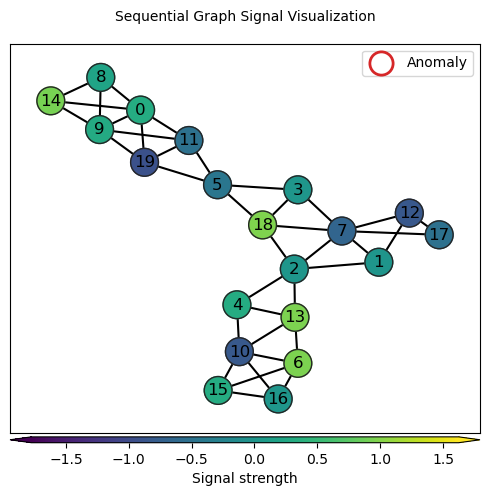

In [38]:
GSPAnimation = GraphSignalAnimation(G,X, figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=40, interval=300, blit=True)
HTML(anim.to_jshtml())

In [24]:
G = nx.random_geometric_graph(20,0.3, seed=100)
GP = GraphProcess(G=G, seed=100, filter_type='Heat', filter_parameters=10)
x = GP.gen_signal(10,0,0)
X = x['X']
# anomaly, anomaly_labels = generate_local_anomaly(X,G, 'constant', 1, local_mode=1, num_of_anomalies=5, radius=1)
# anomaly, anomaly_labels = generate_sparse_anomaly(X,'constant', 1, num_of_anomalies=1)
anomaly, anomaly_labels = generate_temporal_anomaly(X, amplitude=1, 
                            num_of_anomalies=4, anomaly_duration=4,
                            window_type='boxcar', distribution='constant',
                            temporal_mode=2, seed=None)
Y = anomaly


In [19]:
Y.shape

(20, 10)

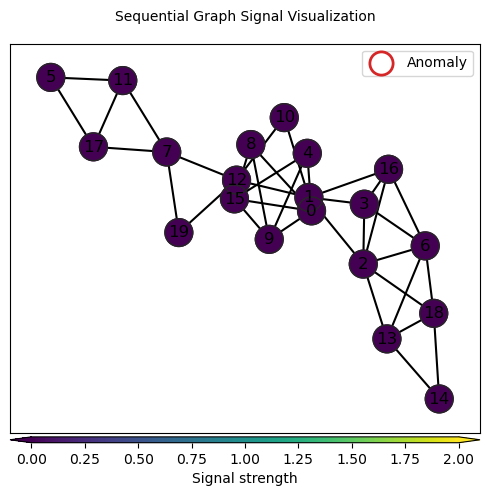

In [18]:
GSPAnimation = GraphSignalAnimation(G,Y, anomaly_labels=anomaly_labels, figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=10, interval=400, blit=True)
HTML(anim.to_jshtml())

In [23]:
dims = (36,50)
time_m = 2
local_m = 1
an, an_m = generate_spatio_temporal_anomaly(dims, G,36, duration=8, radius =2, seed=11,
 time_m=time_m, local_m=local_m, window_type='boxcar',
 distribution='bernoulli', local_dist='not')

ValueError: Number of vertices in the graph G does not match indicated the local_mode dimension. G:20!= dims[local_mode]36

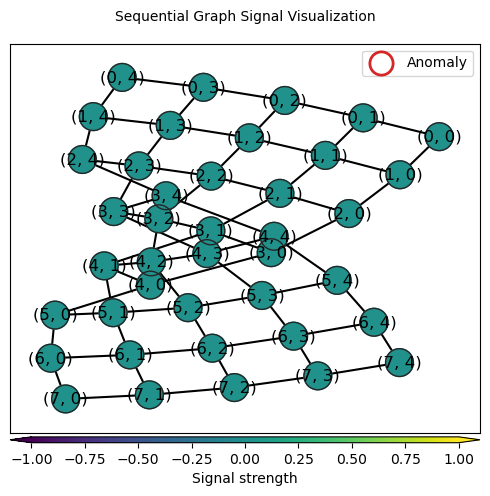

In [8]:
GSPAnimation = GraphSignalAnimation(G,an, anomaly_labels=an_m, figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=10, interval=400, blit=True)
HTML(anim.to_jshtml())

In [4]:
from src.util.generate_lr_data import generate_low_rank_data
from src.util.generate_connected_graph import generate_connected_graph
from src.algos.lr_stss import lr_stss, plot_alg
from sklearn.metrics import roc_auc_score
from matplotlib import ticker
from tqdm import tqdm

In [ ]:
def ensure_connected(size, param, seed, maxit=200):
    it = 0
    while True:
        G = nx.random_geometric_graph(size,0.25, seed=seed+it)
        if nx.is_connected(G):
            print("Graph is connected.")
            break
        it +=1
    if it == maxit:
        raise ValueError("Couldn't construct a connected graph")
    return G


In [7]:
dims = (40,100)
ranks = (8,20)
time_m = 2
local_m = 1
noa = 20
dtn = 4
rad =1
seed = 11
amp =1

# G,_ = generate_connected_graph(dims[0],'geometric', radius=0.25,seed=0)
G,_ = generate_connected_graph((8,5),'grid',seed=0)
A = nx.adjacency_matrix(G)
X = generate_low_rank_data(dims, ranks)
an, an_m = generate_spatio_temporal_anomaly(dims, G,noa, duration=dtn, radius =rad, seed=seed,
 time_m=time_m, local_m=local_m, window_type='boxcar', amplitude=amp,
 distribution='bernoulli', local_dist='constant')
X = 1*X/np.std(X)
Y = X+an
Y = np.ma.masked_array(Y, mask=np.zeros(dims,dtype=bool))

Graph is connected.
Graph is connected.


C:\Users\merti\AppData\Local\Temp\ipykernel_75736\1819022208.py:13: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)
c:\Users\merti\ResearchRepos\TensorAnomalyDetection\src\util\generate_anomaly.py:165: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


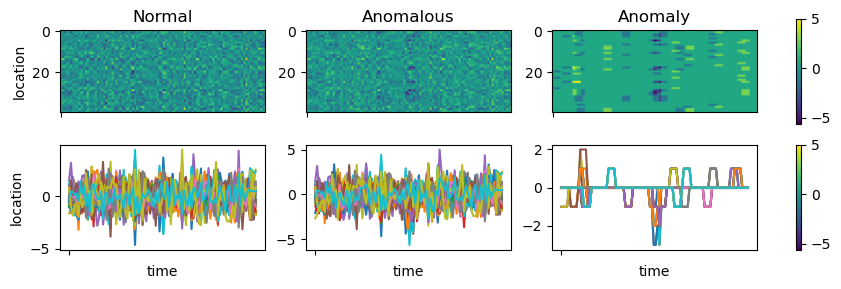

In [96]:
norm = cm.colors.Normalize(vmax=np.max(Y), vmin=np.min(Y))
fig, axs = plt.subplots(2,3, figsize=(10,3))
axs[0,0].imshow(X)
axs[0,0].set_ylabel('location')
axs[0,0].set_title('Normal')
axs[0,1].imshow(Y)
axs[0,1].set_title('Anomalous')
axs[0,2].imshow(Y-X)
axs[0,2].set_title('Anomaly')
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=mpl.colormaps['viridis']), ax=axs[0,:], fraction=0.05,);
axs[1,0].plot(X.T)
axs[1,0].set_xlabel('time')
axs[1,0].set_ylabel('location')
axs[1,1].plot(Y.T)
axs[1,1].set_xlabel('time')
axs[1,2].plot(Y.T-X.T)
axs[1,2].set_xlabel('time')
axs[0,0].set_xticks(np.arange(1), ['']*1)
axs[0,1].set_xticks(np.arange(1), ['']*1)
axs[0,2].set_xticks(np.arange(1), ['']*1)
axs[1,0].set_xticks(np.arange(1), ['']*1)
axs[1,1].set_xticks(np.arange(1), ['']*1)
axs[1,2].set_xticks(np.arange(1), ['']*1)
ticker.NullLocator()
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=mpl.colormaps['viridis']), ax=axs[1,:], fraction=0.05,);

In [97]:
Deg = np.diag(np.asarray(np.sum(A,axis=1)).ravel())
Dsq = np.linalg.inv(np.sqrt(Deg))
An = Dsq@A@Dsq
psi = 9
result = lr_stss(Y, An, 2,1, verbose=1, max_it2=40, max_it=300,
lda_2=1, lda_1=1, lda_t=1.5, lda_l=0.00001, psis=[psi*2,psi*3])

It-2:	## |r|=34.15607 	 ## |s|=95.79547 	 ## rho=1.0000 obj=6708.5673 	 ## del_obj = 5504.1195 
It-3:	## |r|=20.31895 	 ## |s|=34.27828 	 ## rho=1.0000 obj=8574.7457 	 ## del_obj = 1866.1784 
It-4:	## |r|=15.93238 	 ## |s|=13.97606 	 ## rho=1.0000 obj=9166.3828 	 ## del_obj = 591.6371 
It-5:	## |r|=14.81961 	 ## |s|=8.18272 	 ## rho=1.0000 obj=9405.7521 	 ## del_obj = 239.3693 
It-6:	## |r|=13.57007 	 ## |s|=6.04733 	 ## rho=1.0000 obj=9509.9389 	 ## del_obj = 104.1868 
It-7:	## |r|=12.19018 	 ## |s|=4.15767 	 ## rho=1.0000 obj=9553.0011 	 ## del_obj = 43.0622 
It-8:	## |r|=10.80208 	 ## |s|=2.74191 	 ## rho=1.0000 obj=9521.5462 	 ## del_obj = -31.4549 
It-9:	## |r|=9.20968 	 ## |s|=3.42592 	 ## rho=1.0000 obj=9518.7422 	 ## del_obj = -2.8040 
It-10:	## |r|=8.02767 	 ## |s|=2.68961 	 ## rho=1.0000 obj=9492.5181 	 ## del_obj = -26.2241 
It-11:	## |r|=6.99117 	 ## |s|=3.14167 	 ## rho=1.0000 obj=9474.4296 	 ## del_obj = -18.0885 
It-12:	## |r|=6.30617 	 ## |s|=2.60369 	 ## rho=1.0000 obj

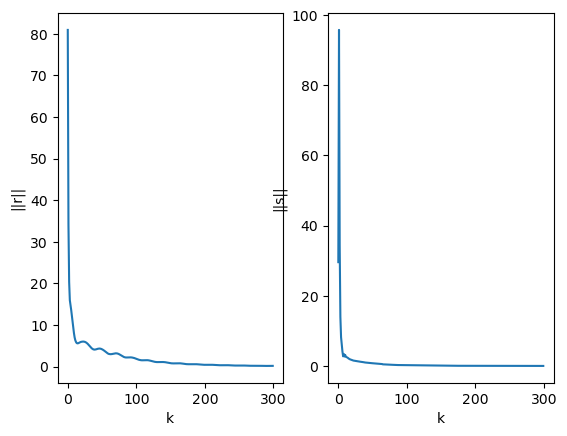

In [98]:
fig, axs = plt.subplots(1,2)
axs[0].plot(result['r'])
axs[0].set_xlabel("k");
axs[0].set_ylabel("||r||");
axs[1].plot(result['s'])
axs[1].set_xlabel("k");
axs[1].set_ylabel("||s||");

In [99]:
print(np.linalg.norm(result['X']-X, 'fro')/np.linalg.norm(X, 'fro'))
roc_auc_score(an_m.ravel(),np.abs(result['S']).ravel())

0.08783788928049245


0.9963836287745547

## Original Signal Animation

In [33]:
GSPAnimation = GraphSignalAnimation(G,t2m(Y,1), anomaly_labels=t2m(an_m,1), figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=int(np.prod(dims[1:])), interval=400, blit=True)
HTML(anim.to_jshtml())

NameError: name 'an_m' is not defined

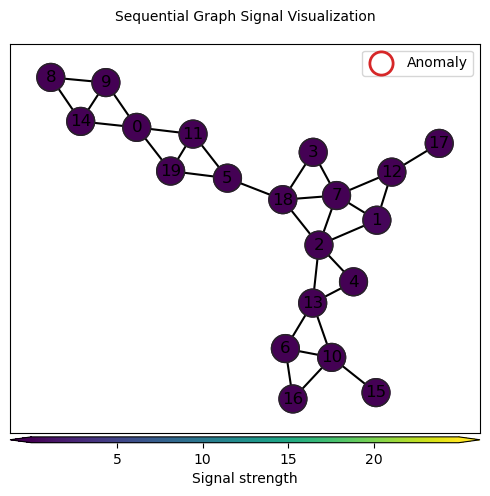

In [224]:
GSPAnimation = GraphSignalAnimation(G,t2m(np.abs(result['S']),1), anomaly_labels=t2m(an_m,1), figsize=(5,5))
anim = FuncAnimation(GSPAnimation.fig, GSPAnimation,frames=int(np.prod(dims[1:])), interval=400, blit=True)
HTML(anim.to_jshtml())

## Hyperparameter Effect Study on LT-STSS

In [26]:
dims = (40,24,7,8)
ranks = (8,8,5,8)
time_m = 2
local_m = 1
noa = np.array([40])#,4,8,16,32,48,64])
NoT = 1
dtn = 4
rad =1
seed = 11
amp =1

auc = np.zeros((NoT,len(noa)))
x_recons = np.zeros((NoT,len(noa)))

for i in range(NoT):
    X = generate_low_rank_data(dims, ranks)
    X = 1*X/np.std(X)
    for j in tqdm(range(len(noa))):
        # (8,5),'grid',seed=0)
        G,sd = generate_connected_graph(dims[0], 'geometric', radius=0.25,seed=0)
        A = nx.adjacency_matrix(G)
        
        an, an_m = generate_spatio_temporal_anomaly(dims, G,noa[j], duration=dtn, radius =rad, seed=seed+i,
        time_m=time_m, local_m=local_m, window_type='boxcar', amplitude=amp,
        distribution='bernoulli', local_dist='constant')
        
        Y = X+an
        Y = np.ma.masked_array(Y, mask=np.zeros(dims,dtype=bool))

        Deg = np.diag(np.asarray(np.sum(A,axis=1)).ravel())
        Dsq = np.linalg.inv(np.sqrt(Deg))
        An = Dsq@A@Dsq
        psi = 20
        result = lr_stss(Y, An, 2,1, verbose=0, max_it2=40, max_it=300,
        lda_2=1, lda_1=1, lda_t=1.5, lda_l=0.00001, psis=[psi,psi,psi,psi])
        
        x_recons[i,j] = np.linalg.norm(result['X']-X)/np.linalg.norm(X)
        auc[i,j] = roc_auc_score(an_m.ravel(),np.abs(result['S']).ravel())
        

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\merti\AppData\Local\Temp\ipykernel_75736\3490232847.py:21: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)
c:\Users\merti\ResearchRepos\TensorAnomalyDetection\src\util\generate_anomaly.py:165: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


Graph is connected.


100%|██████████| 1/1 [01:20<00:00, 80.24s/it]


In [27]:
x_recons


array([[0.00949479]])

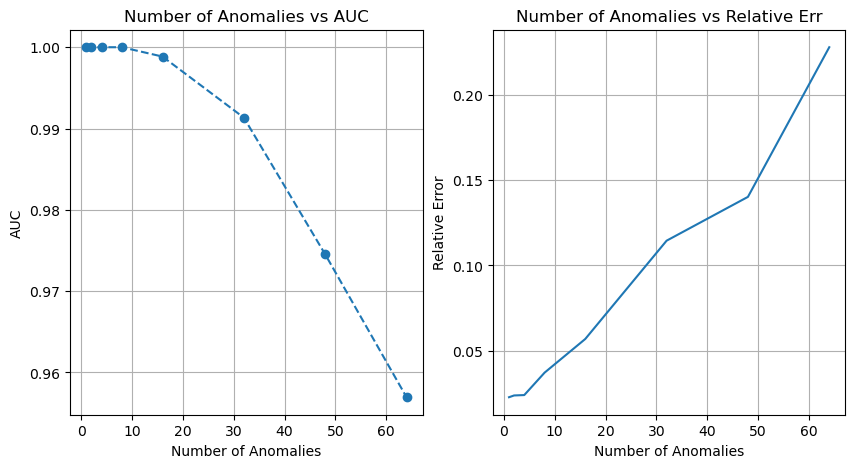

In [112]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
axs[0].plot(noa,auc[0,:],'o--')
axs[0].set_ylabel('AUC')
axs[0].set_title('Number of Anomalies vs AUC')
axs[0].set_xlabel('Number of Anomalies')

axs[1].plot(noa,x_recons[0,:])
axs[1].set_ylabel('Relative Error')
axs[1].set_title('Number of Anomalies vs Relative Err')
axs[1].set_xlabel('Number of Anomalies')
axs[0].grid()
axs[1].grid()

In [17]:
x_recons

array([[0.00296534]])

In [115]:
dims = (40,100)
ranks = (8,20)
time_m = 2
local_m = 1
noa = 32
NoT = 1
dtn_rads = [(4,1),(1,2)]#[(4,0), (4,1), (1,1), (1,2)]
lda_ls = np.logspace(1,-3,4,endpoint=True)
lda_ts = np.logspace(1,-3,4,endpoint=True)
seed = 11
amp =1

auc = np.zeros((NoT,len(dtn_rads),4,4))
x_recons = np.zeros((NoT,len(dtn_rads),4,4))

for i in range(NoT):
    X = generate_low_rank_data(dims, ranks)
    X = 1*X/np.std(X)
    G = ensure_connected(dims[0],0.22,0)
    A = nx.adjacency_matrix(G)
    
    an, an_m = generate_spatio_temporal_anomaly(dims, G,noa, duration=dtn, radius =rad, seed=seed+i,
    time_m=time_m, local_m=local_m, window_type='boxcar', amplitude=amp,
    distribution='bernoulli', local_dist='constant')
    
    Y = X+an
    Y = np.ma.masked_array(Y, mask=np.zeros(dims,dtype=bool))

    Deg = np.diag(np.asarray(np.sum(A,axis=1)).ravel())
    Dsq = np.linalg.inv(np.sqrt(Deg))
    An = Dsq@A@Dsq

    for j in tqdm(range(len(dtn_rads))):
        
        for p in range(4):
            for k in range(4):
                psi = 9
                result = lr_stss(Y, An, 2,1, verbose=0, max_it2=40, max_it=300,
                lda_2=1, lda_1=1, lda_t=lda_ts[p], lda_l=lda_ls[k], psis=[psi*2,psi*3])
                
                x_recons[i,j,p,k] = np.linalg.norm(result['X']-X, 'fro')/np.linalg.norm(X, 'fro')
                auc[i,j,p,k] = roc_auc_score(an_m.ravel(),np.abs(result['S']).ravel())


C:\Users\merti\AppData\Local\Temp\ipykernel_44304\1702788695.py:20: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)
c:\Users\merti\ResearchRepos\TensorAnomalyDetection\src\util\generate_anomaly.py:165: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


Graph is connected.


100%|██████████| 2/2 [08:59<00:00, 269.53s/it]


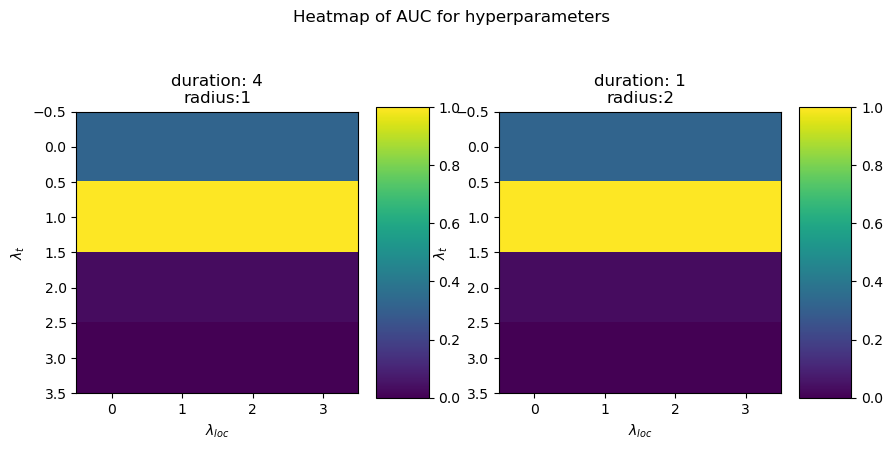

In [135]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
fig.suptitle("Heatmap of AUC for hyperparameters")
axs[0].imshow(auc[0,0,...])
axs[0].set_ylabel('AUC')
axs[0].set_title(f'duration: 4\nradius:1')
axs[0].set_xlabel(r'$\lambda_{loc}$')
# axs[0].xaxis.set_major_locator(ticker.Locator(lda_ts))
axs[0].set_ylabel(r'$\lambda_{t}$')
axs[1].imshow(auc[0,1,...])
axs[1].set_ylabel('AUC')
# axs[1].xaxis.set_major_locator(ticker.LogFormatterExponent(10))
axs[1].set_title(f'duration: 1\nradius:2')
axs[1].set_xlabel(r'$\lambda_{loc}$')
axs[1].set_ylabel(r'$\lambda_{t}$')
norm = cm.colors.Normalize(vmax=1, vmin=0)
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=mpl.colormaps['viridis']), ax=axs[0],aspect=5.5);
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=mpl.colormaps['viridis']), ax=axs[1],aspect=5.5);

array([1.00000000e+01, 4.64158883e-01, 2.15443469e-02, 1.00000000e-03])